## Описание задачи

Вы сотрудник Отдела Data Science популярного музыкального стримингового сервиса "МиФаСоль". Сервис расширяет работу с новыми артистами и музыкантами, в связи с чем возникла задача -- правильно классифицировать новые музыкальные треки, чтобы улучшить работу рекомендательной системы. Ваши коллеги из отдела работы со звуком подготовили датасет, в котором собраны некоторые характеристики музыкальных произведений и их жанры. Ваша задача -- разработать модель, позволяющую классифицировать музыкальные произведения по жанрам.

Описание полей данных

instance_id - уникальный идентификатор трека

track_name - название трека

acousticness - акустичность

danceability - танцевальность

duration_ms -продолжительность в милисекундах

energy - энергичность

instrumentalness - инструментальность

key - тональность

liveness - привлекательность

loudness - громкость


mode - наклонение

speechiness - выразительность

tempo - темп

obtained_date - дата загрузки в сервис

valence - привлекательность произведения для пользователей

music_genre - музыкальный жанр

### Загрузка данных

In [1]:
#!pip install imbalanced-learn
#!pip install -U ydata-profiling
#!pip install feature-engine
#%pip install optuna

In [2]:
#pip install catboost


In [64]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


from phik.report import plot_correlation_matrix
from phik import report
from catboost import CatBoostClassifier
from imblearn.combine import SMOTETomek
from imblearn.pipeline import make_pipeline as make_imblearn_pipeline
from sklearn.linear_model import LogisticRegression



from sklearn.preprocessing import (OrdinalEncoder, StandardScaler, OneHotEncoder,
                                   MinMaxScaler, LabelEncoder, RobustScaler, PolynomialFeatures)
from sklearn.svm import SVC


from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    f1_score,
    precision_score,
    recall_score,
    roc_curve

)
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer
from feature_engine.selection import DropCorrelatedFeatures
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
#import folium
#from folium.plugins import HeatMap
#import plotly.express as px



from ydata_profiling import ProfileReport
import optuna
#import lightgbm as lgb


In [4]:
pd.set_option('display.max_columns', None)

In [5]:
df_train = pd.read_csv('kaggle_music_genre_train.csv')
df_test  = pd.read_csv('kaggle_music_genre_test.csv')


In [6]:

df_train.name = 'Информация по обучаещему датасету'
df_test.name = 'Информация по тествому датасету'

In [7]:
profile_train = ProfileReport(df_train, title="Pandas Profiling Report")
profile_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
global_correlation, global_labels = df_train.global_phik()

interval columns not set, guessing: ['instance_id', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']


C:\Users\alina\anaconda3\lib\site-packages\phik\data_quality.py:59: UserWarning: The number of unique values of variable track_name is large: 18643. Are you sure this is not an interval variable? Analysis for pairs of variables including track_name can be slow.
  warnings.warn(
C:\Users\alina\anaconda3\lib\site-packages\phik\phik.py:319: RuntimeWarning: invalid value encountered in sqrt
  global_correlations = np.sqrt(


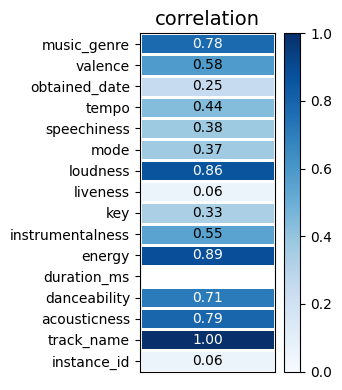

In [9]:
plot_correlation_matrix(global_correlation, 
                        x_labels=[''], y_labels=global_labels, 
                        vmin=0, vmax=1, figsize=(3.5,4),
                        color_map="Blues")
plt.tight_layout()

In [10]:
df_train = df_train.drop_duplicates()

In [11]:
df_train.isna().sum()

instance_id           0
track_name            0
acousticness          0
danceability          0
duration_ms           0
energy                0
instrumentalness      0
key                 735
liveness              0
loudness              0
mode                506
speechiness           0
tempo               442
obtained_date         0
valence               0
music_genre           0
dtype: int64

Можем заметить мультиколлинеарные столбцы energy, loudness, acousticness.

In [12]:
def plot_kde(data):
    # Получаем список числовых столбцов
    numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

    fig, ax = plt.subplots(figsize=(10, 6))

    # Построение sns.kdeplot для каждого числового столбца на одном графике

    for column in numeric_columns:
        plt.figure(figsize=(8, 6))
        sns.kdeplot(data[column], fill=True)
        plt.title(f'Kernel Density Estimation for {column}')
        plt.xlabel(column)
        plt.ylabel('Density')
        plt.show()

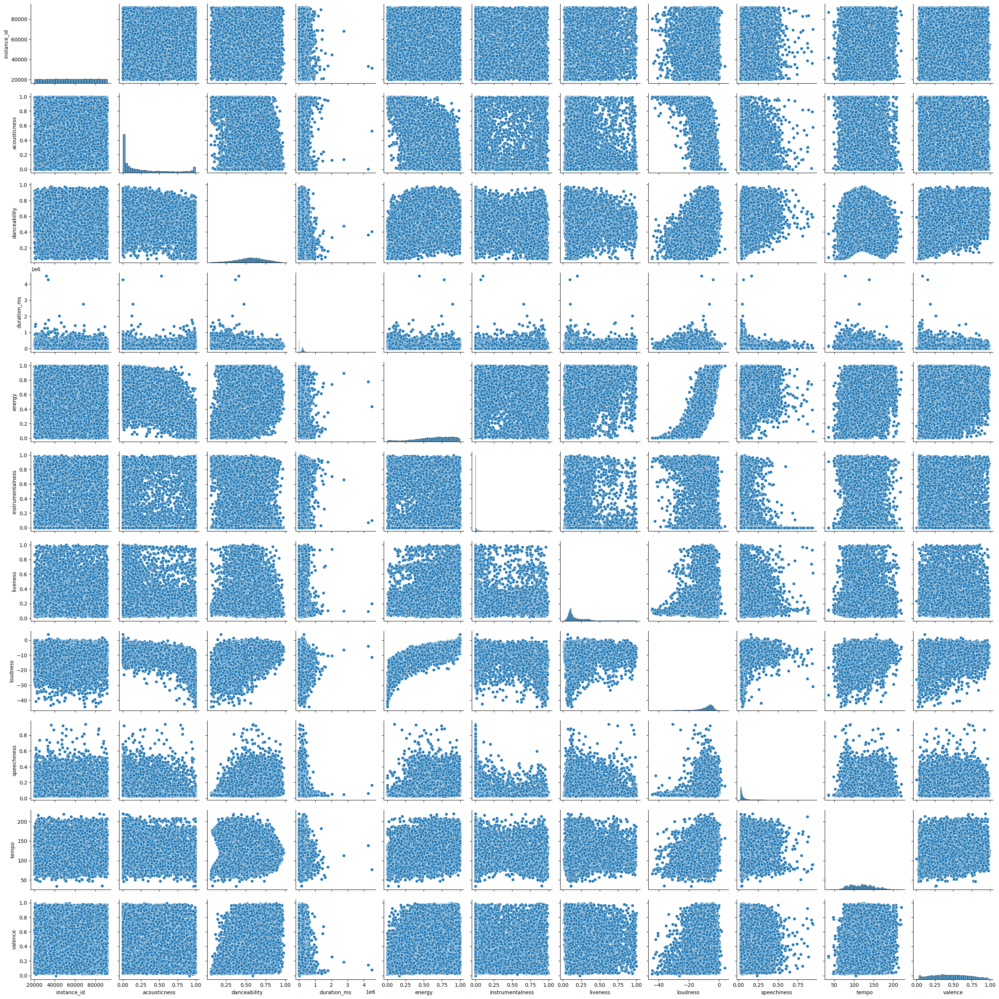

In [13]:
sns.pairplot(df_train)

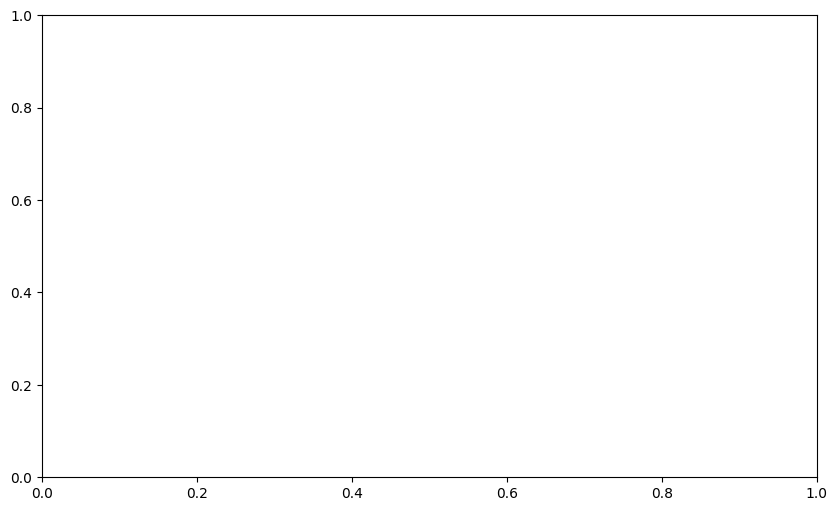

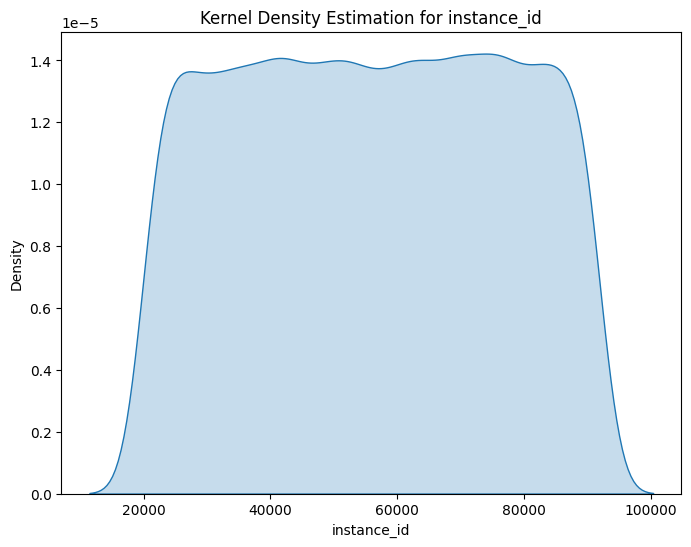

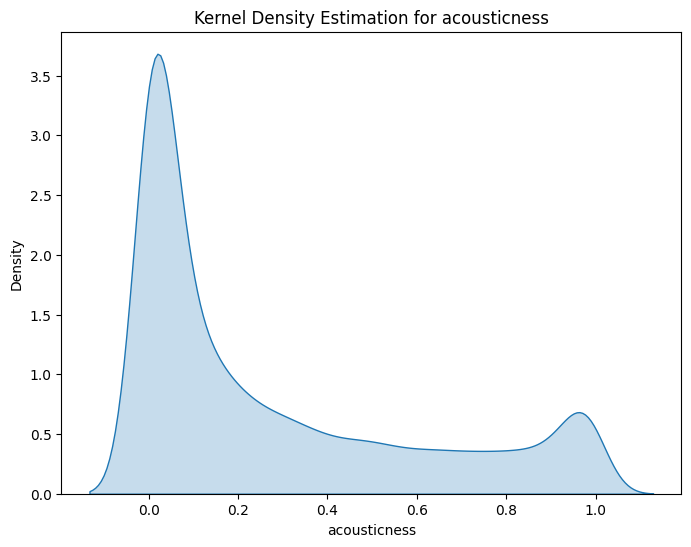

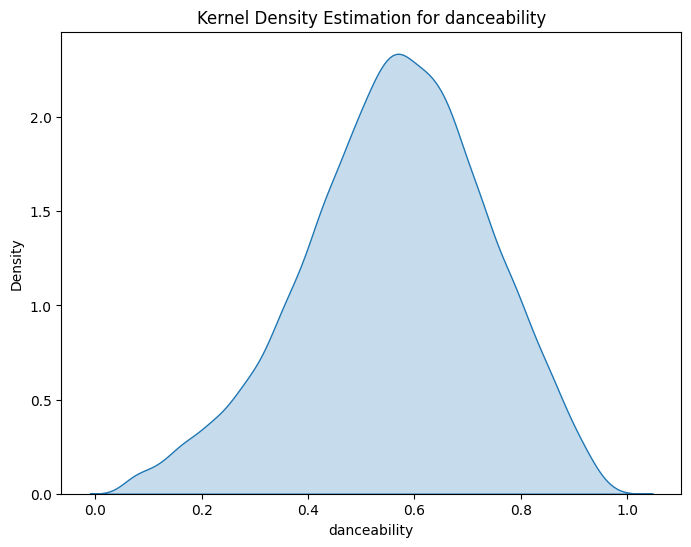

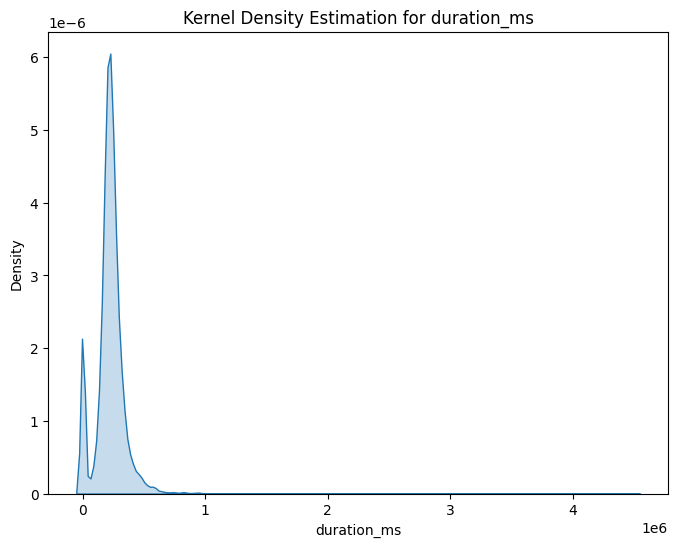

...

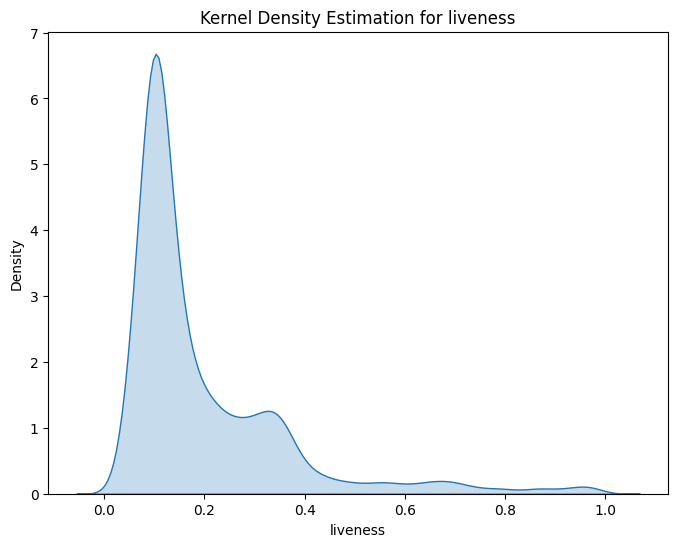

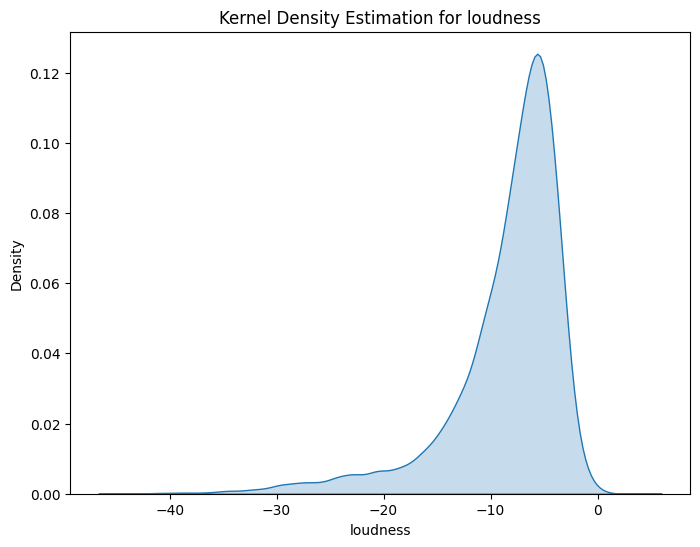

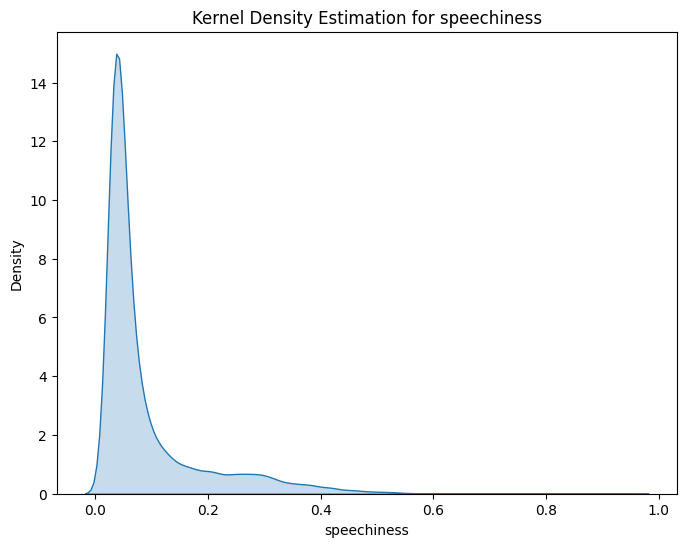

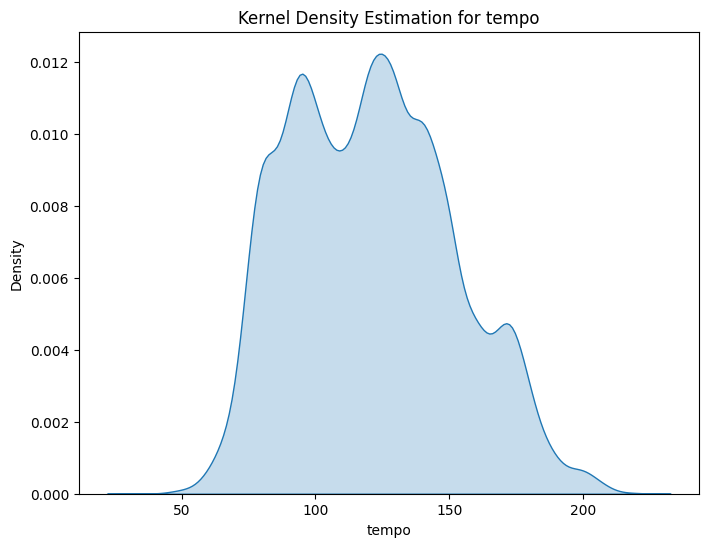

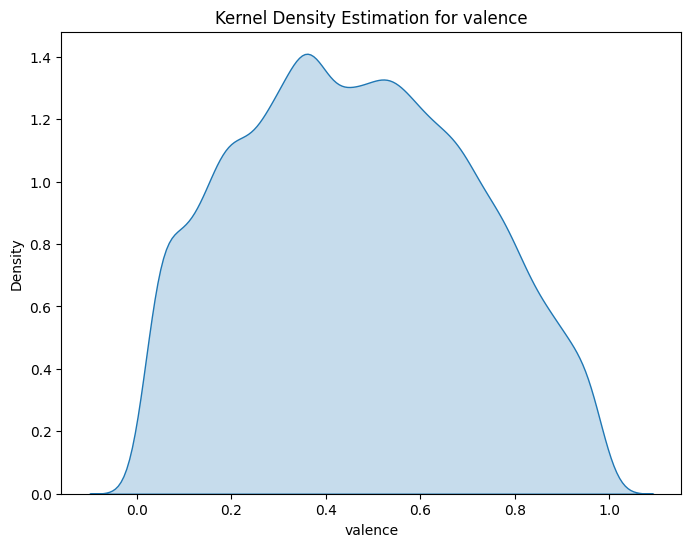

In [14]:
 plot_kde(df_train)

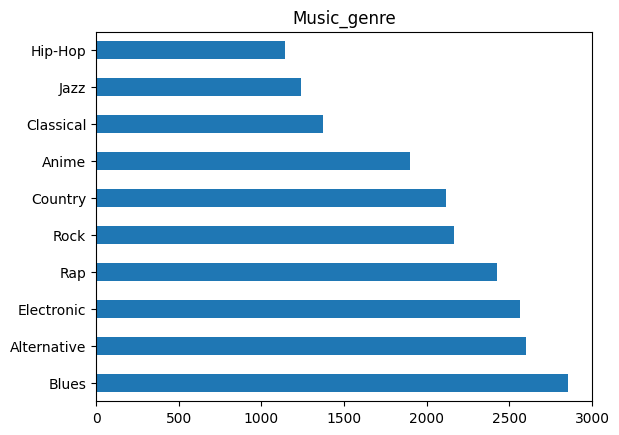

In [15]:
df_train["music_genre"].value_counts().plot.barh().set_title("Music_genre");

После проведения data_profilling, можем сделатиь выводы:

* имеются пропуски в столбцах key, mode, tempo;
* коррелируют столбцы music_genre, dancebility ,energy,loudness, acousticness 



### Подготовка данных к обучению моделей

In [16]:
Y = df_train.music_genre
X = df_train.drop('music_genre', axis = 1)
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=42)

In [17]:
cat_columns = X.select_dtypes(exclude = 'number').columns.tolist()
num_columns = X.select_dtypes(include='number').columns.tolist()
cat_columns

['track_name', 'key', 'mode', 'obtained_date']

In [63]:
# создадим pipeoline для заполнения пропусков, нормализации, удаления корреллирующих столбоцов
num_pipe = Pipeline(steps=[
    ('imputer', KNNImputer(n_neighbors = 7, weights = 'uniform')),
    ('scaler', MinMaxScaler()),
    ('corr_features', DropCorrelatedFeatures(threshold=0.75))
])

cat_pipe = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('encode', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])


num_pipe:

* 'imputer': KNNImputer для вычисления пропущенных значений. Он заменяет пропущенные значения средним значением k-ближайших соседей.

* 'scaler':MinMaxScaler для масштабирования числовых объектов.

* 'corr_features': DropCorrelatedFeatures для удаления сильно коррелированных объектов. Этот шаг удаляет один из двух коррелированных объектов на основе порога корреляции  0,75.

cat_pipe:

* "impute": На этом шаге используется SimpleImputer для замены пропущенных значений в категориальные объекты, использует наиболее часто встречающееся значение в каждом признаке.

* 'encode':  OrdinalEncoder для кодирования категориальных объектов с помощью порядкового кодирования. 

In [19]:
transform = ColumnTransformer(
      transformers=[('num', num_pipe, num_columns),
                    ('cat', cat_pipe, cat_columns)])

In [20]:

clf = CatBoostClassifier(
     eval_metric='TotalF1'
 )

pipeline = Pipeline(steps=[
    ('transform', transform),
    ('model', clf)
])

param_clf = {
    'model__depth': [ 4, 8, 12],  
    'model__learning_rate': [0.001, 0.01, 0.1],  
    'model__l2_leaf_reg': [1, 3, 5],  
    'model__iterations': [100, 200, 300],  
    'model__border_count': [5, 10, 20],  
    'model__thread_count': [4],  
    'model__early_stopping_rounds': [8],  
    'model__bootstrap_type': ['Bayesian', 'Bernoulli', 'MVS']
}

 

# Создание GridSearchCV
### GridSearch очень долго обучается
#grid = GridSearchCV(pipeline,
 ##                  cv=3,
#                 verbose=5,
#                    scoring='f1_micro',
#                    n_jobs=None)
    

grid_cbc = RandomizedSearchCV(pipeline,
                           param_clf,
                           n_iter=50,
                           cv=3,
                           verbose=5,
                           random_state=42,
                           scoring='f1_micro',
                           n_jobs=None)


In [21]:
%%time
grid_cbc.fit(X_train, Y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
0:	learn: 0.4408993	total: 446ms	remaining: 1m 28s
1:	learn: 0.4779947	total: 721ms	remaining: 1m 11s
2:	learn: 0.4972538	total: 995ms	remaining: 1m 5s
3:	learn: 0.5079861	total: 1.27s	remaining: 1m 2s
4:	learn: 0.5040746	total: 1.54s	remaining: 59.9s
5:	learn: 0.4932919	total: 1.8s	remaining: 58.4s
6:	learn: 0.4943878	total: 2.08s	remaining: 57.3s
7:	learn: 0.4936451	total: 2.35s	remaining: 56.4s
8:	learn: 0.4921156	total: 2.61s	remaining: 55.5s
9:	learn: 0.4963565	total: 2.95s	remaining: 56.1s
10:	learn: 0.4986142	total: 3.25s	remaining: 55.8s
11:	learn: 0.5003485	total: 3.51s	remaining: 55s
12:	learn: 0.4988568	total: 3.86s	remaining: 55.5s
13:	learn: 0.5003314	total: 4.13s	remaining: 54.9s
14:	learn: 0.5051081	total: 4.39s	remaining: 54.2s
15:	learn: 0.5066736	total: 4.65s	remaining: 53.5s
16:	learn: 0.5038024	total: 4.92s	remaining: 52.9s
17:	learn: 0.5058737	total: 5.18s	remaining: 52.4s
18:	learn: 0.5095465	total: 5.4

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('transform',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                KNNImputer(n_neighbors=7)),
                                                                                               ('scaler',
                                                                                                MinMaxScaler()),
                                                                                               ('corr_features',
                                                                                                DropCorrelatedFeatures(threshold=0.75))]),
                                                                               ['instance_id',
                                                                                'acousticness',
                                                                                'danceability',
                                                                                'duration_ms',
                                                                                'energy',
                                                                                'instrumentalness',
                                                                                'liveness',
                                                                                'loudness',...
                   n_iter=50,
                   param_distributions={'model__bootstrap_type': ['Bayesian',
                                                                  'Bernoulli',
                                                                  'MVS'],
                                        'model__border_count': [5, 10, 20],
                                        'model__depth': [4, 8, 12],
                                        'model__early_stopping_rounds': [8],
                                        'model__iterations': [100, 200, 300],
                                        'model__l2_leaf_reg': [1, 3, 5],
                                        'model__learning_rate': [0.001, 0.01,
                                                                 0.1],
                                        'model__thread_count': [4]},
                   random_state=42, scoring='f1_micro', verbose=5)

In [22]:
print("Best parameters: ", grid_cbc.best_params_)
print("Best F1 Score: {:.4f}".format(grid_cbc.best_score_))

Best parameters:  {'model__thread_count': 4, 'model__learning_rate': 0.1, 'model__l2_leaf_reg': 1, 'model__iterations': 300, 'model__early_stopping_rounds': 8, 'model__depth': 4, 'model__border_count': 10, 'model__bootstrap_type': 'MVS'}
Best F1 Score: 0.4572


In [23]:
#def objective(trial):
 #   clf = CatBoostClassifier(
  #      depth=trial.suggest_int('depth', 4, 12),
  #     learning_rate=trial.suggest_loguniform('learning_rate', 0.001, 0.1),
  #      l2_leaf_reg=trial.suggest_loguniform('l2_leaf_reg', 1, 5),
  #      iterations=trial.suggest_int('iterations', 100, 300),
   #     border_count=trial.suggest_int('border_count', 5, 20),
   #     thread_count=4,
   #     early_stopping_rounds=8,
   #     bootstrap_type=trial.suggest_categorical('bootstrap_type', ['Bayesian', 'Bernoulli', 'MVS']),
   #     max_ctr_complexity=trial.suggest_int('max_ctr_complexity', 1, 3),
   #     eval_metric='TotalF1',
   #     verbose=False
   # )

    #pipeline = Pipeline(steps=[
     #   ('transform', transform),
    #    ('model', clf)
    #])

    #pipeline.fit(X_train, Y_train)

#    predictions = pipeline.predict(X_test)

 #   f1 = f1_score(Y_test, predictions, average='micro')

  #  return f1

#study = optuna.create_study(direction='maximize')
#study.optimize(objective, n_trials=50)  

#best_params = study.best_params


In [24]:
lr = LogisticRegression(tol=0.01)
pipeline = Pipeline(steps=[
     ('transform', transform),
     ('model', lr)
    
])    
param_lr = {
    'model__C': [0.001, 0.01, 0.1, 1, 10, 100],
    'model__penalty': ['l1', 'l2'],
    'model__solver': ['liblinear', 'saga']
}
#grid = GridSearchCV(pipeline,
#                    param_lr,
#                    cv=3,
#                    verbose=5,
#                    scoring='f1_micro',
#                    n_jobs=None)
        
    
    
grid_lr = RandomizedSearchCV(pipeline,
                           param_lr,
                           n_iter=50,
                           cv=3,
                           verbose=5,
                           random_state=42,
                           scoring='f1_micro',
                           n_jobs=None)    

In [25]:
%%time

grid_lr.fit(X_train, Y_train)

Fitting 3 folds for each of 24 candidates, totalling 72 fits


C:\Users\alina\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:306: UserWarning: The total space of parameters 24 is smaller than n_iter=50. Running 24 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


[CV 1/3] END model__C=0.001, model__penalty=l1, model__solver=liblinear;, score=0.125 total time=   0.4s
[CV 2/3] END model__C=0.001, model__penalty=l1, model__solver=liblinear;, score=0.110 total time=   0.3s
[CV 3/3] END model__C=0.001, model__penalty=l1, model__solver=liblinear;, score=0.121 total time=   0.3s
[CV 1/3] END model__C=0.001, model__penalty=l1, model__solver=saga;, score=0.057 total time=   0.4s
[CV 2/3] END model__C=0.001, model__penalty=l1, model__solver=saga;, score=0.058 total time=   0.4s
[CV 3/3] END model__C=0.001, model__penalty=l1, model__solver=saga;, score=0.060 total time=   0.4s
[CV 1/3] END model__C=0.001, model__penalty=l2, model__solver=liblinear;, score=0.077 total time=   0.4s
[CV 2/3] END model__C=0.001, model__penalty=l2, model__solver=liblinear;, score=0.067 total time=   0.4s
[CV 3/3] END model__C=0.001, model__penalty=l2, model__solver=liblinear;, score=0.080 total time=   0.4s
[CV 1/3] END model__C=0.001, model__penalty=l2, model__solver=saga;, s

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('transform',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                KNNImputer(n_neighbors=7)),
                                                                                               ('scaler',
                                                                                                MinMaxScaler()),
                                                                                               ('corr_features',
                                                                                                DropCorrelatedFeatures(threshold=0.75))]),
                                                                               ['instance_id',
                                                                                'acousticness',
                                                                                'danceability',
                                                                                'duration_ms',
                                                                                'energy',
                                                                                'instrumentalness',
                                                                                'liveness',
                                                                                'loudness',...
                                                                                               ('encode',
                                                                                                OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                                               unknown_value=-1))]),
                                                                               ['track_name',
                                                                                'key',
                                                                                'mode',
                                                                                'obtained_date'])])),
                                             ('model',
                                              LogisticRegression(tol=0.01))]),
                   n_iter=50,
                   param_distributions={'model__C': [0.001, 0.01, 0.1, 1, 10,
                                                     100],
                                        'model__penalty': ['l1', 'l2'],
                                        'model__solver': ['liblinear', 'saga']},
                   random_state=42, scoring='f1_micro', verbose=5)

In [26]:
print("Best parameters : ", grid_lr.best_params_)
print("Best F1 Score: {:.4f}".format(grid_lr.best_score_))

Best parameters :  {'model__solver': 'liblinear', 'model__penalty': 'l1', 'model__C': 1}
Best F1 Score: 0.3804


In [27]:
rf_classifier = RandomForestClassifier()

pipeline = Pipeline(steps=[
    ('transform', transform),
    ('model', rf_classifier)
])

param_rfc = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [None, 10, 20],
    'model__min_samples_split': [2, 5, 10],
    'model__min_samples_leaf': [1, 2, 4],
}

#grid = GridSearchCV(pipeline,
#                    param_rfc,
#                    cv=3,
#                    verbose=5,
#                    scoring='f1_micro',
#                    n_jobs=-1)

grid_rf =RandomizedSearchCV(pipeline,
                         param_rfc,
                         cv=3,
                         verbose=5,
                         scoring='f1_micro',
                         n_jobs=-1)




In [28]:
%%time
grid_rf.fit(X_train, Y_train)


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Wall time: 52.4 s


RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('transform',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                KNNImputer(n_neighbors=7)),
                                                                                               ('scaler',
                                                                                                MinMaxScaler()),
                                                                                               ('corr_features',
                                                                                                DropCorrelatedFeatures(threshold=0.75))]),
                                                                               ['instance_id',
                                                                                'acousticness',
                                                                                'danceability',
                                                                                'duration_ms',
                                                                                'energy',
                                                                                'instrumentalness',
                                                                                'liveness',
                                                                                'loudness',...
                                                                                                OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                                               unknown_value=-1))]),
                                                                               ['track_name',
                                                                                'key',
                                                                                'mode',
                                                                                'obtained_date'])])),
                                             ('model',
                                              RandomForestClassifier())]),
                   n_jobs=-1,
                   param_distributions={'model__max_depth': [None, 10, 20],
                                        'model__min_samples_leaf': [1, 2, 4],
                                        'model__min_samples_split': [2, 5, 10],
                                        'model__n_estimators': [100, 200, 300]},
                   scoring='f1_micro', verbose=5)

In [29]:
print("Best parameters found: ", grid_rf.best_params_)
print("Best F1 Score: {:.4f}".format(grid_rf.best_score_))

Best parameters found:  {'model__n_estimators': 100, 'model__min_samples_split': 2, 'model__min_samples_leaf': 4, 'model__max_depth': 20}
Best F1 Score: 0.4559


### Обучение на тестовой выборке

In [30]:
cbc = CatBoostClassifier(
    thread_count=4,
    max_ctr_complexity=1,
    learning_rate=0.1,
    l2_leaf_reg=1,
    iterations=300,
    early_stopping_rounds=8,
    depth=4,
    border_count=10,
    bootstrap_type='MVS'
)

cbc_pipeline = Pipeline(steps=[
    ('transform', transform ),
    ('model', cbc)
])

cbc_pipeline.fit(X_train, Y_train)
cbc_predict = cbc_pipeline.predict(X_test)



0:	learn: 2.2008183	total: 11.6ms	remaining: 3.48s
1:	learn: 2.1286086	total: 23.4ms	remaining: 3.48s
2:	learn: 2.0680414	total: 34.6ms	remaining: 3.42s
3:	learn: 2.0208060	total: 45.6ms	remaining: 3.37s
4:	learn: 1.9788955	total: 58ms	remaining: 3.42s
5:	learn: 1.9446137	total: 70.2ms	remaining: 3.44s
6:	learn: 1.9126521	total: 82.1ms	remaining: 3.44s
7:	learn: 1.8862548	total: 94ms	remaining: 3.43s
8:	learn: 1.8593681	total: 107ms	remaining: 3.46s
9:	learn: 1.8370274	total: 119ms	remaining: 3.44s
10:	learn: 1.8139142	total: 130ms	remaining: 3.42s
11:	learn: 1.7956168	total: 143ms	remaining: 3.43s
12:	learn: 1.7780311	total: 155ms	remaining: 3.42s
13:	learn: 1.7611292	total: 166ms	remaining: 3.39s
14:	learn: 1.7439084	total: 178ms	remaining: 3.39s
15:	learn: 1.7322313	total: 189ms	remaining: 3.35s
16:	learn: 1.7186913	total: 199ms	remaining: 3.31s
17:	learn: 1.7069254	total: 212ms	remaining: 3.32s
18:	learn: 1.6956227	total: 225ms	remaining: 3.32s
19:	learn: 1.6843393	total: 239ms	rem

In [31]:
print('f1_micro =', f1_score(Y_test, cbc_predict, average='micro').round(2))

f1_micro = 0.46


In [32]:
lr = LogisticRegression(tol=0.01, solver='liblinear', penalty='l1', C=100)

lr_pipeline = Pipeline(steps=[
     ('transform', transform),
     ('model', lr)
    
])

lr_pipeline.fit(X_train, Y_train)
lr_pred = lr_pipeline.predict(X_test)


In [33]:
print('f1_micro =', f1_score(Y_test, lr_pred, average='micro').round(2))

f1_micro = 0.36


In [34]:
rfc = RandomForestClassifier(n_estimators=300, max_depth= None, min_samples_split = 10, min_samples_leaf = 2)

rfc_pipeline = Pipeline(steps=[
    ('transform', transform),
    ('model', rfc)
])

rfc_pipeline.fit(X_train, Y_train)
rfc_pred = rfc_pipeline.predict(X_test)

In [35]:
print('f1_micro =', f1_score(Y_test, rfc_pred, average='micro').round(2))

f1_micro = 0.46


In [59]:
predictive_model_scores = pd.DataFrame([
    ('CatBoostClassifier', round(grid_cbc.best_score_, 3), f1_score(Y_test, cbc_predict, average='micro').round(3)),
    ('LogisticRegression', round(grid_lr.best_score_, 3), f1_score(Y_test, lr_pred, average='micro').round(3)),
    ('RandomForestClassifier', round(grid_rf.best_score_, 3), f1_score(Y_test, rfc_pred, average='micro').round(3))
], columns=['model', 'training_f1', 'testing_f1'])

print(predictive_model_scores)

                    model  training_f1  testing_f1
0      CatBoostClassifier        0.457       0.463
1      LogisticRegression        0.380       0.364
2  RandomForestClassifier        0.456       0.461


In [62]:
#best_cbc_model = grid_cbc.best_estimator_.named_steps['model']


#feature_importances = pd.Series(best_cbc_model.feature_importances_, index=X_train.columns).nlargest(20)
#feature_importances.plot(kind='barh')
#plt.title('Feature Importances (CatBoostClassifier)')
#plt.xlabel('Importance')
#plt.ylabel('Features')
#plt.tight_layout()
#plt.show()

 Лучшие показатели у CatBoostClassifier - 0.463

### Обучение на тестовом датафрейме

In [44]:
df_test = df_test.drop(['instance_id', 'track_name', 'obtained_date'], axis=1)

In [47]:
x_test = df_train.drop('music_genre', axis =1)
y_test = df_train.music_genre

In [65]:
cbc_pipeline.fit(x_test, y_test)
predictions = cbc_pipeline.predict(df_test)

music_genre = music_genre.ravel().tolist()

pred_series = pd.Series(predictions, name='music_genre')

# Создаем столбца с instance_id
instance_id_column = df_test['instance_id']

# Создание DataFrame из нужных столбцов
sample_submit = pd.concat([instance_id_column, pred_series], axis=1)

# Сохранение DataFrame с предсказаниями в файл
sample_submit.to_csv('cbc_pipeline.csv', index=False)

0:	learn: 2.1977207	total: 19.7ms	remaining: 5.9s
1:	learn: 2.1258068	total: 36.3ms	remaining: 5.4s
2:	learn: 2.0651832	total: 49.4ms	remaining: 4.89s
3:	learn: 2.0152663	total: 63.3ms	remaining: 4.69s
4:	learn: 1.9751035	total: 78.2ms	remaining: 4.61s
5:	learn: 1.9415302	total: 92.5ms	remaining: 4.53s
6:	learn: 1.9076429	total: 107ms	remaining: 4.46s
7:	learn: 1.8798718	total: 121ms	remaining: 4.42s
8:	learn: 1.8554236	total: 136ms	remaining: 4.39s
9:	learn: 1.8296434	total: 151ms	remaining: 4.38s
10:	learn: 1.8096430	total: 165ms	remaining: 4.33s
11:	learn: 1.7909867	total: 179ms	remaining: 4.28s
12:	learn: 1.7735564	total: 193ms	remaining: 4.26s
13:	learn: 1.7573499	total: 204ms	remaining: 4.17s
14:	learn: 1.7392374	total: 219ms	remaining: 4.16s
15:	learn: 1.7242515	total: 234ms	remaining: 4.15s
16:	learn: 1.7111864	total: 248ms	remaining: 4.13s
17:	learn: 1.6996902	total: 263ms	remaining: 4.12s
18:	learn: 1.6890643	total: 276ms	remaining: 4.08s
19:	learn: 1.6770686	total: 291ms	rem

KeyError: "['instance_id'] not in index"